<font size="6"><b>Modelos de riesgo de crédito </b></font>

**Integrantes:**
- Jakelin Daiana Correa Palacio
- Daniela Guardia Cuervo
- Dayra Gabriela Chamorro Revelo
- Fredy Alberto Orozco Loaiza
- Cristian Camilo Henao Rojas

In [ ]:
# Start writing code here...
import pandas as pd
import missingno as msno
from pandas_profiling import ProfileReport
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, roc_auc_score, confusion_matrix, precision_recall_curve, auc
from sklearn.feature_selection import f_classif
from sklearn import pipeline, preprocessing, compose
from sklearn.base import BaseEstimator, TransformerMixin
from scipy.stats import chi2_contingency
from sklearn.decomposition import PCA, TruncatedSVD
from optbinning import OptimalBinning, BinningProcess

## Settings
SEED = 42
def puts_seed(SEED):
    import random
    np.random.seed(SEED)
    random.seed(SEED)

puts_seed(SEED)

In [ ]:
df = pd.read_csv('/datasets/loan/loan_data_2007_2014.csv')
df.head()

/shared-libs/python3.9/py-core/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3139: DtypeWarning: Columns (19) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,C1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,B5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
_deepnote_run_altair(df, """{"data":{"name":"placeholder"},"mark":{"type":"bar","tooltip":true},"height":220,"$schema":"https://vega.github.io/schema/vega-lite/v4.json","autosize":{"type":"fit"},"encoding":{"x":{"sort":null,"type":"nominal","field":"loan_status","scale":{"type":"linear","zero":false}},"y":{"sort":null,"type":"quantitative","field":"COUNT(*)","scale":{"type":"linear","zero":true},"aggregate":"count"},"color":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear","zero":false}}}}""")

In [ ]:
df.shape

(466285, 74)

## Análisis de valores nulos

En el conjunto de datos existen valores nulos, los cuales pueden afectar la calidad de los potenciales modelos que se pueden construir a partir de los datos. Para mejor detección se realiza la siguiente gráfica:

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 74 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           466285 non-null  int64  
 1   member_id                    466285 non-null  int64  
 2   loan_amnt                    466285 non-null  int64  
 3   funded_amnt                  466285 non-null  int64  
 4   funded_amnt_inv              466285 non-null  float64
 5   term                         466285 non-null  object 
 6   int_rate                     466285 non-null  float64
 7   installment                  466285 non-null  float64
 8   grade                        466285 non-null  object 
 9   sub_grade                    466285 non-null  object 
 10  emp_title                    438697 non-null  object 
 11  emp_length                   445277 non-null  object 
 12  home_ownership               466285 non-null  object 
 13 

En cada una de las caracteristicas las líneas blancas indican la proporción de valores faltantes y las barras grises completitud de los datos, es decir entre más cerca esté la barra a 1 significa que esa variable tiene mayor cantidad de valores no nulos, lo cual implica que cuánto más corta es la barra, más valores nulos existen.

<AxesSubplot:>

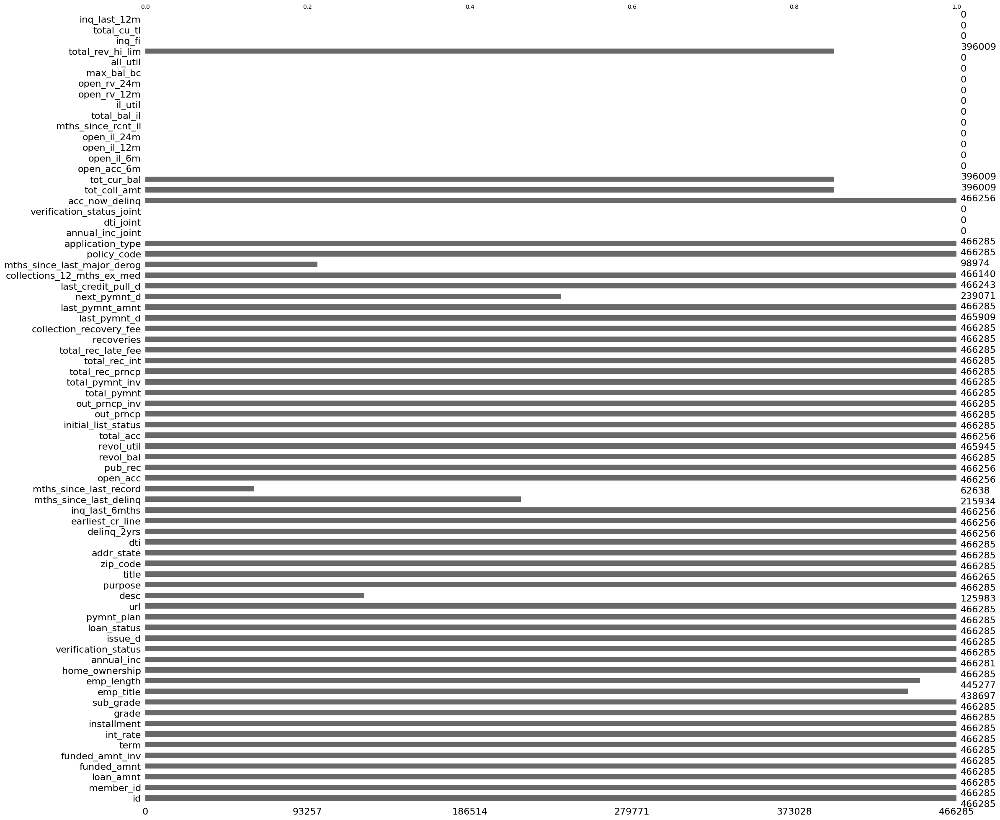

In [ ]:
msno.bar(df)

De las 74 columnas (las cuales representan variables), 17 tienen todos los registros en nulo, 10 tienen una porción de registros faltantes o nulos y el resto de características presentan completitud de información.

Se eliminan las características con más del 70% de valores nulos, ya que no aportan suficiente información al modelo y podrían generar ruido en el mismo. Además, se eliminan columnas con información irrelevante para el modelo, no relacionadas con el incumplimiento de obligaciones financieras en los siguientes 12 meses a la fecha de originación del crédito como ids e información sobre eventos futuros que no deben ser incluídos en su construcción.


In [ ]:
missing_values = df.isnull().mean()
missing_values[missing_values>0.7].index

Index(['desc', 'mths_since_last_record', 'mths_since_last_major_derog',
       'annual_inc_joint', 'dti_joint', 'verification_status_joint',
       'open_acc_6m', 'open_il_6m', 'open_il_12m', 'open_il_24m',
       'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m',
       'open_rv_24m', 'max_bal_bc', 'all_util', 'inq_fi', 'total_cu_tl',
       'inq_last_12m'],
      dtype='object')

In [ ]:
#dropping irrelevant cols & cols with missing values

columns_to_drop = ['id', 'member_id', 'sub_grade', 'emp_title', 'url', 'desc', 'title', 'zip_code', 'next_pymnt_d',
                  'recoveries', 'collection_recovery_fee', 'total_rec_prncp', 'total_rec_late_fee', 'desc', 'mths_since_last_record',
                  'mths_since_last_major_derog', 'annual_inc_joint', 'dti_joint', 'verification_status_joint', 'open_acc_6m', 'open_il_6m',
                  'open_il_12m', 'open_il_24m', 'mths_since_rcnt_il', 'total_bal_il', 'il_util', 'open_rv_12m', 'open_rv_24m',
                  'max_bal_bc', 'all_util', 'inq_fi', 'total_cu_tl', 'inq_last_12m','policy_code',]
df.drop(columns=columns_to_drop, inplace=True, axis=1)

# Filas con valores nulos
# df.dropna(inplace=True)

Después de realizar los cambios anteriormente mencionados, la nueva condición del conjunto de datos respecto a la ausencia de información se muestra a continuación.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 41 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   loan_amnt                   466285 non-null  int64  
 1   funded_amnt                 466285 non-null  int64  
 2   funded_amnt_inv             466285 non-null  float64
 3   term                        466285 non-null  object 
 4   int_rate                    466285 non-null  float64
 5   installment                 466285 non-null  float64
 6   grade                       466285 non-null  object 
 7   emp_length                  445277 non-null  object 
 8   home_ownership              466285 non-null  object 
 9   annual_inc                  466281 non-null  float64
 10  verification_status         466285 non-null  object 
 11  issue_d                     466285 non-null  object 
 12  loan_status                 466285 non-null  object 
 13  pymnt_plan    

Así, de 74 características iniciales, se redujo el conjunto de datos a las siguientes 40 variables:
* loan_amnt -> importe indicado del préstamo solicitado por el prestatario (refleja si se cambia el monto por el departamento).
* funded_amnt -> cantidad total comprometida con ese préstamo en ese momento.
* funded_amnt_inv -> monto total comprometido por los inversionistas para ese préstamo en ese momento.
* term -> número de pagos del préstamo. Los valores están expresados ​​en meses y pueden ser 36 o 60.
* int_rate -> tasa de interés de préstamo.
* installment -> pago mensual (cuota).
* grade -> nota asignada por Lending club (A-G). Entre más alto la tasa de interés y el riesgo, mayor clasificación.
* emp_lenght -> duración del empleo en años [0,10].
* home_ownership -> estado de propiedad al momento del préstamo (ALQUILER, PROPIO, HIPOTECA, OTROS).
* annual_inc -> ingreso anual del prestatario al momento del préstamo.
* issue_d -> fecha en la que se financió el préstamo.
* loan_status -> estado actual del préstamo.
* pymnt_plan -> ¿Se ha establecido un plan de pago?.
* purpose -> propósito del prestamo, tiene categorías.
* addr_state -> estado del prestatario al momento del préstamo.
* dti -> relación calculada utilizando los pagos de deuda mensuales totales del prestatario sobre las obligaciones de deuda totales, excluyendo la hipoteca y el préstamo de LC solicitado, dividido por los ingresos mensuales autodeclarados del prestatario.
* delinq_2yrs -> El número de incidencias de morosidad de más de 30 días en el archivo de crédito del prestatario durante los últimos 2 años.
* earliest_cr_line -> mes en el que inició el préstamo.
* inq_last_6mths -> número de consultas en los últimos 6 meses (excluyendo consultas sobre automóviles e hipotecas).
* mths_since_last_delinq -> número de meses desde la última morosidad del prestatario.
* oepn_acc -> número de operaciones abiertas.
* pub_rec -> número de registros públicos derogatorios.
* revol_bal -> saldo total del crédito renovable.
* revol_util -> tasa de utilización de la línea rotatoria, o la cantidad de crédito que el prestatario está utilizando en relación con todo el crédito rotatorio disponible.
* total_acc -> número total de líneas de crédito que figuran actualmente en el expediente de crédito del prestatario.
* initial_list_status -> estado inicial de la lista del préstamo. <b>[Ver cuales son los valores]</b>
* out_prncp -> capital restante para el importe total financiado.               
* out_prncp_inv -> capital pendiente de pago para la parte del importe total financiado por los inversores. 
* total_pymnt -> pagos recibidos hasta la fecha por el importe total financiado.                
* total_pymnt_inv -> pagos recibidos hasta la fecha por la parte del importe total financiado por los inversores.
* total_rec_int ->intereses recibidos hasta la fecha.     
* last_pymnt_d -> se recibió el pago del último mes.            
* last_pymnt_amnt -> último importe total de pago recibido.          
* last_credit_pull_d -> el mes más reciente en que LC sacó crédito para este préstamo.
* collections_12_mths_ex_med -> número de cobros en 12 meses, excluyendo los cobros médicos.
* application_type ->  indica si el préstamo es una solicitud individual o una solicitud conjunta con dos co-prestatarios.      
*  acc_now_delinq -> el número de cuentas en las que el prestatario es ahora moroso.            
* tot_coll_amt ->  total de los importes de cobro que se deben.           
* tot_cur_bal -> saldo total actual de todas las cuentas.                 
* total_rev_hi_lim -> total de crédito rotativo alto/límite de crédito.



## Análisis exploratorio

En ésta sección se pretende resumir las principales características del conjunto de datos para una mejor comprensión de las variables y las relaciones entre ellas.

La base de datos contiene 4 grupos generales que caracterizan el crédito.

<b>1. Columnas relacionadas con la característica básica del préstamo:</b>
'id', 'loan_amnt', 'funded_amnt', 'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade', 'sub_grade', 'application_type'

<b>2. Columnas relacionadas con la identidad básica del prestatario:</b>
'member_id', 'emp_title', 'emp_length', 'home_ownership', 'annual_inc', 'verification_status', 'zip_code', 'addr_state', 'dti'

<b>3. Columnas relacionadas con los registros personales del prestatario:</b>
'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths', 'mths_since_last_delinq', 'mths_since_last_record', 'open_acc', 'pub_rec', 'revol_bal', 'revol_util', 'total_acc', 'initial_list_status', 'acc_now_delinq'

<b>4. Columnas relacionadas con el estado actual del préstamo (después de su emisión): </b>
'issue_d', 'loan_status', 'pymnt_plan', 'out_prncp', 'out_prncp_inv', 'total_pymnt', 'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 'recoveries', 'collection_recovery_fee', 'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d'

### Correlación entre variables

Se genera la matriz de correlación con los valores de correlación de Pearson y así poder diferenciar el grado de relación lineal entre cada par de variables del conjunto de datos.

/tmp/ipykernel_1217/1804595026.py:1: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(df.corr().fillna(0), dtype=np.bool)


<AxesSubplot:>

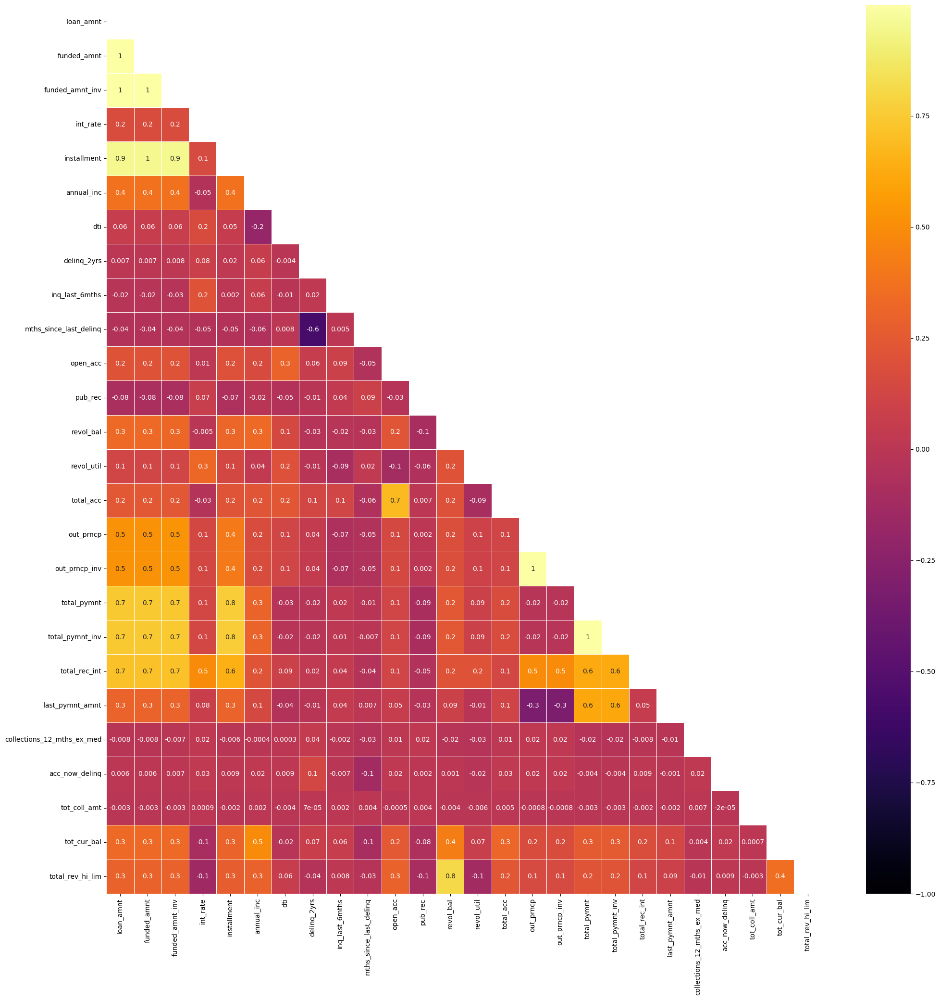

In [ ]:
mask = np.zeros_like(df.corr().fillna(0), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(24,24))
sns.heatmap(df.corr(), mask=mask, annot=True,  cmap="inferno", vmin = -1, fmt='.1g', edgecolor='w', linewidth=0.6)

Las variables con valores de correlación mayores que 0.7 se consideran altamente correlacionadas. A continuación se presentan las relaciones fuertemente correlacionadas:

- loan_amnt vs  funded_amnt, funded_amnt_inv, installment, total_payment, total_pymnt_inv, total_rec_int

- funded_amnt vs  funded_amnt_inv, installment, total_payment, total_pymnt_inv, total_rec_int

- funded_amnt_inv vs installment, total_payment, total_pymnt_inv, total_rec_int

- installment vs total_payment, total_pymnt_inv, total_rec_int

- total_acc vs open_acc

- out_prncp vs  out_prncp_inv

-  total_pymnt vs total_pymnt_inv

-  revol_bal vs total_rev_hi_lim

Se descartan variables casi redundantes, es decir, las que se encuentran fuertemente correlacionadas. Por lo que a continuación se eliminan algunas de las variables de cada grupo presentado anteriormente.

In [ ]:
 df.drop(columns=['loan_amnt', 'revol_bal', 'funded_amnt', 'funded_amnt_inv', 'installment',  
                   'total_pymnt_inv',  'out_prncp_inv',  'total_acc'], inplace=True)

## Transformación de los datos

### División de la columna objetivo en bueno y malo.

In [ ]:
df["loan_status"].unique()

array(['Fully Paid', 'Charged Off', 'Current', 'Default',
       'Late (31-120 days)', 'In Grace Period', 'Late (16-30 days)',
       'Does not meet the credit policy. Status:Fully Paid',
       'Does not meet the credit policy. Status:Charged Off'],
      dtype=object)

In [ ]:
# create a new column based on the loan_status column that will be our target variable
df['bad_loan'] = np.where(df.loc[:, 'loan_status'].isin(['Charged Off', 'Default', 'Late (31-120 days)',
                                        'Does not meet the credit policy. Status:Charged Off']), 1, 0)
# Drop the original 'loan_status' column
Y = df['bad_loan'].copy()
df.drop(columns = ['loan_status'], inplace = True)

### Conversión de variables.

La variable 'emp_length' contiene letras y símbolos, por lo cual se reemplazan esos valores para convertirla en una columna de tipo numérico.

In [ ]:
def emp_length_convert(df, column):
    df[column] = df[column].str.replace('\+ years', '')
    df[column] = df[column].str.replace('< 1 year', str(0))
    df[column] = df[column].str.replace(' years', '')
    df[column] = df[column].str.replace(' year', '')
    df[column] = pd.to_numeric(df[column])
    df[column].fillna(value = 0, inplace = True)

In [ ]:
emp_length_convert(df, 'emp_length')

/tmp/ipykernel_1217/348653590.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  df[column] = df[column].str.replace('\+ years', '')


In [ ]:
df['emp_length'].unique()

array([10.,  0.,  1.,  3.,  8.,  9.,  4.,  5.,  6.,  2.,  7.])

De igual forma, se convierte la columna 'term' a numérica.

In [ ]:
def term_numeric(df, column):
    df[column] = pd.to_numeric(df[column].str.replace(' months', ''))
    
term_numeric(df, 'term')

Finalmente, convertimos las columnas que tienen fecha a formato datetime para mejor manipulación.

In [ ]:
def date_columns(df, column):
    # store current month
    today_date = pd.to_datetime('2020-08-01')
    # convert to datetime format
    df[column] = pd.to_datetime(df[column], format = "%b-%y")
    # calculate the difference in months and add to a new column
    df['mths_since_' + column] = round(pd.to_numeric((today_date - df[column]) / np.timedelta64(1, 'M')))
    # make any resulting -ve values to be equal to the max date
    df['mths_since_' + column] = df['mths_since_' + column].apply(lambda x: df['mths_since_' + column].max() if x < 0 else x)
    # drop the original date column
    df.drop(columns = [column], inplace = True)
    

date_columns(df, 'issue_d')
date_columns(df, 'last_pymnt_d')
date_columns(df, 'last_credit_pull_d')
date_columns(df, 'earliest_cr_line')

## Selección de características 

Además de las variables eliminadas anteriormente por valores nulos, irrelevancia y fuerte correlación, se decide encontrar características que más aporten a la construcción del modelo; estas se clasificaron según los puntajes estadísticos para definir los coeficientes de correlación para los tipos de datos contínuos y categóricos. Para este fin se usan los siguientes métodos:

1. Prueba Chi-cuadrado para ver el grado de asociación entre una variable categórica y la variable objetivo utilizando su distribución de frecuencia. 

undefined. Prueba ANOVA utilizando la distribución F para el respectivo análisis de la varianza y así percibir si la relación de varianzas de las medias son iguales o no entre una variable numérica y la variable objetivo.

undefined. Information Value.

Siendo nuestra variable objetivo Y = 'bad_loan' (variable categórica), se procede respectivamente a realizar las pruebas mencionadas anteriormente.

### Prueba Chi-cuadrado

La prueba de independencia de chi-cuadrado determina si dos campos categóricos son independientes, esto implica que si los campos no son independientes, están asociados.

In [ ]:
X = df.drop('bad_loan', axis = 1)
Y = df['bad_loan']

In [ ]:
categorical_features = X.select_dtypes(exclude='number')
numerical_features = X.select_dtypes(exclude='object')

In [ ]:
chi2_check = {}
for column in categorical_features:
    chi, p, dof, ex = chi2_contingency(pd.crosstab(Y, X[column]))
    chi2_check.setdefault('Feature',[]).append(column)
    chi2_check.setdefault('p-value',[]).append(round(p,10))

Si el valor de significación es menor que el nivel de significancia de α = 0.05, las frecuencias son significativamente diferentes.

In [ ]:
chi2_result = pd.DataFrame(data = chi2_check)
chi2_result.sort_values(by = ['p-value'], ascending = True, ignore_index = True, inplace = True)
chi2_result

,Feature,p-value
0,grade,0.000000
1,home_ownership,0.000000
2,verification_status,0.000000
3,purpose,0.000000
4,addr_state,0.000000
5,initial_list_status,0.000000
6,pymnt_plan,0.007186
7,application_type,1.000000


Entonces, se seleccionan las primeras 6 variables categóricas con  p-value < 0.05 y se eliminan las que no cumplen con esta condición.

In [ ]:
top4_chi2 = chi2_result.nsmallest(6, 'p-value')['Feature'].tolist()
top4_chi2

['grade',
 'home_ownership',
 'verification_status',
 'purpose',
 'addr_state',
 'initial_list_status']

In [ ]:
columns_to_drop_chi = chi2_result['Feature'].tolist()[-2:]
df.drop(columns = columns_to_drop_chi, inplace=True)

In [ ]:
columns_to_drop_chi

['pymnt_plan', 'application_type']

### ANOVA F-estadístico

Para el cálculo del F-estadístico,  se sustituyen los valores nulos de cada columna con la media respectiva, ya que el test no acepta la presencia de valores nulos.

In [ ]:
numerical_features.fillna(numerical_features.mean(), inplace = True)

/shared-libs/python3.9/py/lib/python3.9/site-packages/pandas/core/series.py:4463: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


In [ ]:
F_statistic, p_values = f_classif(numerical_features, Y)
 #convert to a DF
ANOVA_F_table = pd.DataFrame(data = {'Numerical_Feature': numerical_features.columns.values,
					'F-Score': F_statistic, 'p values': p_values.round(decimals=10)})
ANOVA_F_table.sort_values(by = ['F-Score'], ascending = False, ignore_index = True, inplace = True)

En este caso, entre mayor sea el F-Score, mayor significancia aporta la variable en la construcción del modelo.

In [ ]:
ANOVA_F_table

,Numerical_Feature,F-Score,p values
0,mths_since_last_pymnt_d,29460.271841,0.000000e+00
1,total_pymnt,18320.936906,0.000000e+00
2,int_rate,14276.559279,0.000000e+00
3,last_pymnt_amnt,13547.497437,0.000000e+00
4,out_prncp,12043.314244,0.000000e+00
5,mths_since_last_credit_pull_d,8864.328886,0.000000e+00
6,mths_since_issue_d,3603.719527,0.000000e+00
7,inq_last_6mths,2504.987081,0.000000e+00
8,term,1891.654499,0.000000e+00
9,revol_util,1177.047607,0.000000e+00


Se decide conservar las primeras 20 variables con el mayor F-score, ya que el valor para las otras variables es significativamente más bajo comparada con las demás.

In [ ]:
columns_to_drop_f = ANOVA_F_table.iloc[20:,0].to_list()
df.drop(columns = columns_to_drop_f, inplace=True)

In [ ]:
columns_to_drop_f

['mths_since_last_delinq', 'delinq_2yrs', 'tot_coll_amt', 'acc_now_delinq']

### Cálculo del Information Value (IV) y el Weight of Evidence(WoE)

El valor de la información (IV) y el peso de la evidencia (WoE) son medidas de independencia entre cada variable y la variable objetivo.

WoE es una medida del poder predictivo de una variable independiente en relación con la variable objetivo. Mide el grado en que una característica específica puede diferenciar entre clases objetivo, en nuestro caso: buenos y malos clientes. El método discretiza una variables continua dividiendo los valores en intervalos iguales, en otras palabras se crean  múltiples categorías cada una con un WoE diferente y así se calificará a cada persona en consecuencia a la categoría asignada.

IV ayuda a clasificar nuestras funciones en términos de su importancia relativa, su interpretación se basa en:

- IV < 0.02: impredecible, no es útil para modelar (no discrimina morosos y no morosos).

- 0.02 6 IV 6 0.1: el poder de predicción es débil.

- 0.1 6 IV 6 0.3: el poder de predicción es medio.

- IV > 0.3: el poder de predicción es fuerte

In [ ]:
def iv_woe(data, target, bins=10, show_woe=False):
    
    newDF,woeDF = pd.DataFrame(), pd.DataFrame()
    cols = data.columns
    
    #Run WoE and IV on all the independent variables
    for ivars in cols[~cols.isin([target])]:
        if (data[ivars].dtype.kind in 'bifc') and (len(np.unique(data[ivars]))>10):
            binned_x = pd.qcut(data[ivars], bins,  duplicates='drop')
            d0 = pd.DataFrame({'x': binned_x, 'y': data[target]})
        else:
            d0 = pd.DataFrame({'x': data[ivars], 'y': data[target]})
        d = d0.groupby("x", as_index=False).agg({"y": ["count", "sum"]})
        d.columns = ['Cutoff', 'N', 'Events']
        d['% of Events'] = np.maximum(d['Events'], 0.5) / d['Events'].sum()
        d['Non-Events'] = d['N'] - d['Events']
        d['% of Non-Events'] = np.maximum(d['Non-Events'], 0.5) / d['Non-Events'].sum()
        d['WoE'] = np.log(d['% of Events']/d['% of Non-Events'])
        d['IV'] = d['WoE'] * (d['% of Events'] - d['% of Non-Events'])
        d.insert(loc=0, column='Variable', value=ivars)
        temp =pd.DataFrame({"Variable" : [ivars], "IV" : [d['IV'].sum()]}, columns = ["Variable", "IV"])
        newDF=pd.concat([newDF,temp], axis=0)
        woeDF=pd.concat([woeDF,d], axis=0)

        if show_woe == True:
            print(d)
            
    return newDF, woeDF

iv, woe = iv_woe(df, target='bad_loan', bins=20)

In [ ]:
iv.head()

,Variable,IV
0,term,0.038860
0,int_rate,0.330892
0,grade,0.290782
0,emp_length,0.006028
0,home_ownership,0.021672


La regla general dice que todas las variables con un IV < 0,02 no son útiles para la predicción y que un IV > 0,5 tiene un poder predictivo sospechoso. Por lo tanto, las columnas que se eliminarán son las que se encuentran con un iv entre este rango:

In [ ]:
iv_menor = iv[(iv['IV'] < 0.02) | (iv['IV'] > 0.5)] 
iv_menor

,Variable,IV
0,emp_length,0.006028
0,addr_state,0.012518
0,open_acc,0.000743
0,pub_rec,0.000580
0,out_prncp,0.765650
0,total_pymnt,0.641949
0,last_pymnt_amnt,1.549867
0,collections_12_mths_ex_med,0.000414
0,mths_since_last_pymnt_d,2.031578
0,mths_since_earliest_cr_line,0.014746


In [ ]:
preprocess_data = df.copy()

In [ ]:
preprocess_data.drop(columns=iv_menor['Variable'], axis=1, inplace=True)


### Características seleccionadas

Finalmente, las características que se seleccionaron después de aplicar los criterios anteriores son las siguientes:

In [ ]:
count = 1
print("En total son ", len(preprocess_data.columns))
print(preprocess_data.columns)

En total son  17
Index(['term', 'int_rate', 'grade', 'home_ownership', 'annual_inc',
       'verification_status', 'purpose', 'dti', 'inq_last_6mths', 'revol_util',
       'initial_list_status', 'total_rec_int', 'tot_cur_bal',
       'total_rev_hi_lim', 'bad_loan', 'mths_since_issue_d',
       'mths_since_last_credit_pull_d'],
      dtype='object')


In [ ]:
preprocess_data.shape

(466285, 17)

## Modelo de predicción

Se usará un modelo que nos ayude a predecir en cuales se puede dividir mejor los bins. Para eso usamos un modelo que se llama BinningProcess.

In [ ]:
# Lo primero que vamos a hacer es dividir lo conjuto de entrenamiento y de validación
preprocess_data["bad_loan"] = Y
preprocess_data.drop(columns = "bad_loan", inplace=True)


x_train, x_val, y_train, y_val = train_test_split(preprocess_data, Y, test_size=0.20)
print(f"Tamaño de entrenamiento {x_train.shape} con {y_train.shape} labels")
print(f"Tamaño de entrenamiento {x_val.shape} con {y_val.shape} labels")

Tamaño de entrenamiento (373028, 16) con (373028,) labels
Tamaño de entrenamiento (93257, 16) con (93257,) labels


In [ ]:
# si queremos hacer análisis de sencibilidad solo es eliminarlo en alguna de las listas y ya
columns = list(preprocess_data.columns)
categorical_data = list(preprocess_data.select_dtypes(exclude=[np.number]).columns)
numerical_data =  list(preprocess_data.select_dtypes(include=[np.number]).columns)

In [ ]:
binning_process = BinningProcess(columns, categorical_variables=categorical_data)

pipe =  pipeline.Pipeline(steps=[
    ("binning_process", binning_process),
    ("one_hot", preprocessing.OneHotEncoder(handle_unknown='ignore')),
])

x_transform_train = pipe.fit_transform(x_train,y_train)
x_transform_val = pipe.transform(x_val)
print(x_transform_train.shape)
print(x_transform_val.shape)

(373028, 123)
(93257, 123)


## Análisis del WoE

Veamos los mejores bins del modelo. En las siguientes imágenes, se encuentran las variables con los cortes de WoEs modificados de las 16 variables con mejor poder predictivo.

In [ ]:
print(binning_process.summary().to_string())

def creates_analis_woe(model, feature):
    print(feature)
    woe = model.get_binned_variable(feature)
    binning_table = woe.binning_table
    print(binning_table.build().to_string())
    binning_table.plot(metric="woe")



                             name        dtype   status  selected n_bins        iv        js      gini quality_score
0                            term    numerical  OPTIMAL      True      2  0.039434  0.004916  0.091662      0.086929
1                        int_rate    numerical  OPTIMAL      True     12  0.336017  0.040256  0.313712      0.653441
2                           grade  categorical  OPTIMAL      True      5  0.284696  0.034476  0.286259      0.828828
3                  home_ownership  categorical  OPTIMAL      True      3  0.021223   0.00265  0.075366      0.063136
4                      annual_inc    numerical  OPTIMAL      True     12  0.055283  0.006878  0.133308      0.161446
5             verification_status  categorical  OPTIMAL      True      3  0.020384  0.002545  0.076509      0.070559
6                         purpose  categorical  OPTIMAL      True      4  0.030495  0.003796  0.086188        0.0871
7                             dti    numerical  OPTIMAL      Tru

term
                  Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0       (-inf, 48.00)  270419   0.724929     244187  26232    0.097005  0.133209  0.012210  0.001525
1        [48.00, inf)  102609   0.275071      88063  14546    0.141761 -0.297009  0.027224  0.003391
2             Special       0   0.000000          0      0    0.000000       0.0  0.000000  0.000000
3             Missing       0   0.000000          0      0    0.000000       0.0  0.000000  0.000000
Totals                 373028   1.000000     332250  40778    0.109316            0.039434  0.004916


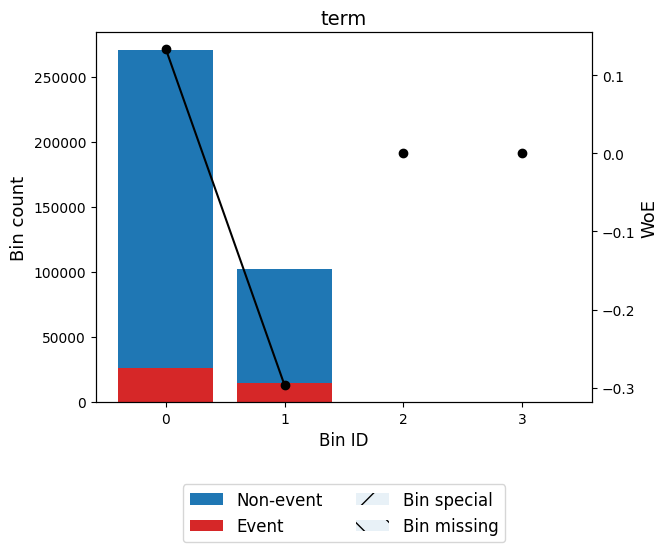

In [ ]:
creates_analis_woe(binning_process,columns[0])

Variable 'term':  Es el número de pagos, una característica básica del préstamo. El método generó 4 bins y la suma de los IV parciales tienen un valor total de 0.039434, lo cual implica un poder predictivo débil. Existe una relación monótona decreciente y lógica entre las clases de la variable 'term' y la proporción de buenos. 

int_rate
                   Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0         (-inf, 7.50)   23543   0.063113      22965    578    0.024551  1.584408  0.087056  0.009870
1         [7.50, 8.35)   20792   0.055738      19862    930    0.044729  0.963634  0.035629  0.004289
2         [8.35, 9.50)   22768   0.061036      21704   1064    0.046732  0.917716  0.036004  0.004349
3        [9.50, 11.01)   36422   0.097639      33973   2449    0.067240  0.532141  0.022453  0.002774
4       [11.01, 12.01)   26296   0.070493      24298   1998    0.075981  0.400502  0.009666  0.001200
5       [12.01, 13.05)   36338   0.097414      33127   3211    0.088365  0.236021  0.004947  0.000617
6       [13.05, 13.98)   33703   0.090350      30322   3381    0.100317  0.095957  0.000801  0.000100
7       [13.98, 15.12)   38880   0.104228      34464   4416    0.113580 -0.043064  0.000197  0.000025
8       [15.12, 15.61)   20758   0.055647      18201   2557    0.123181 -

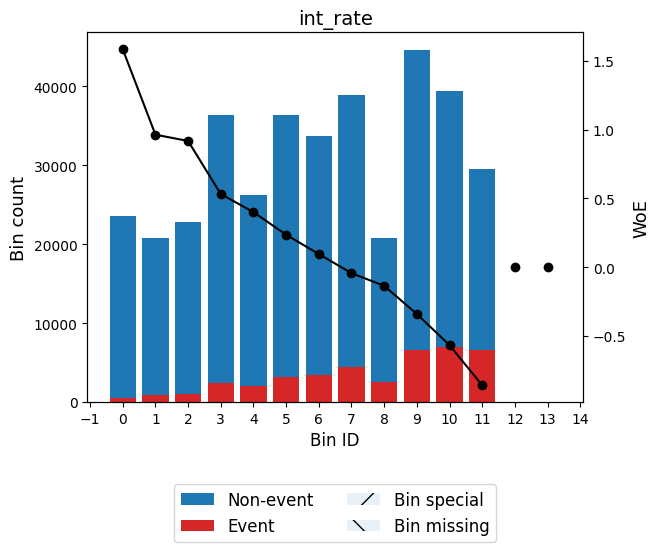

In [ ]:
creates_analis_woe(binning_process,columns[1])

Variable 'int_rate': Es la tasa de interés de préstamo, una característica básica del préstamo. El método generó 14 bins y  la suma de los IV parciales tienen un valor total de 0.336017, lo cual implica un poder predictivo fuerte. Existe una relación decreciente entre las clases de la variable 'int_rate' y la proporción de buenos. 

grade
              Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0             [A]   59759   0.160200      57431   2328    0.038956   1.10783  0.128248  0.015258
1             [B]  109730   0.294160     101063   8667    0.078985  0.358476  0.032850  0.004084
2             [C]  100245   0.268733      88794  11451    0.114230 -0.049503  0.000671  0.000084
3             [D]   61498   0.164862      52046   9452    0.153696 -0.391843  0.029445  0.003657
4       [E, F, G]   41796   0.112045      32916   8880    0.212461 -0.787588  0.093482  0.011392
5         Special       0   0.000000          0      0    0.000000       0.0  0.000000  0.000000
6         Missing       0   0.000000          0      0    0.000000       0.0  0.000000  0.000000
Totals             373028   1.000000     332250  40778    0.109316            0.284696  0.034476


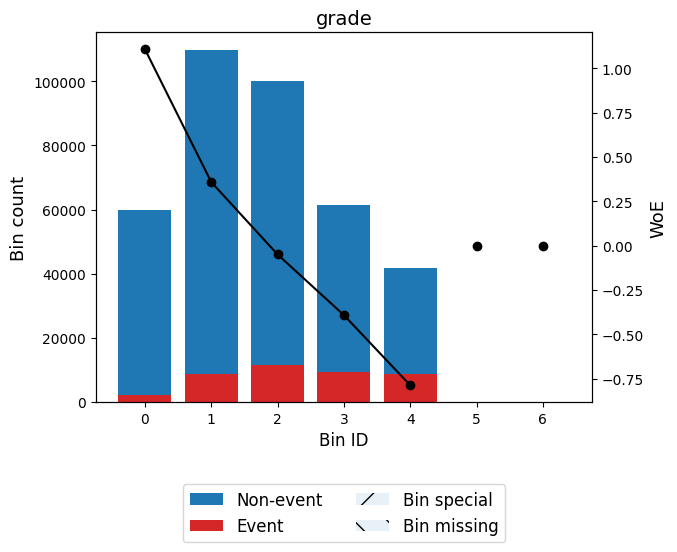

In [ ]:
creates_analis_woe(binning_process,columns[2])

Variable 'grade': Es la nota asignada por Lending club (A-G). Entre más alto la tasa de interés y el riesgo, mayor será la clasificación, una característica básica del préstamo. El método generó 7 bins y la suma de los IV parciales tienen un valor total de  0.284696, lo cual implica un poder predictivo medio. 

home_ownership
                        Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0           [ANY, MORTGAGE]  188957   0.506549     170786  18171    0.096165  0.142839  0.009773  0.001221
1                     [OWN]   33295   0.089256      29717   3578    0.107464   0.01917  0.000033  0.000004
2       [RENT, NONE, OTHER]  150776   0.404195     131747  19029    0.126207 -0.162826  0.011417  0.001426
3                   Special       0   0.000000          0      0    0.000000       0.0  0.000000  0.000000
4                   Missing       0   0.000000          0      0    0.000000       0.0  0.000000  0.000000
Totals                       373028   1.000000     332250  40778    0.109316            0.021223  0.002650


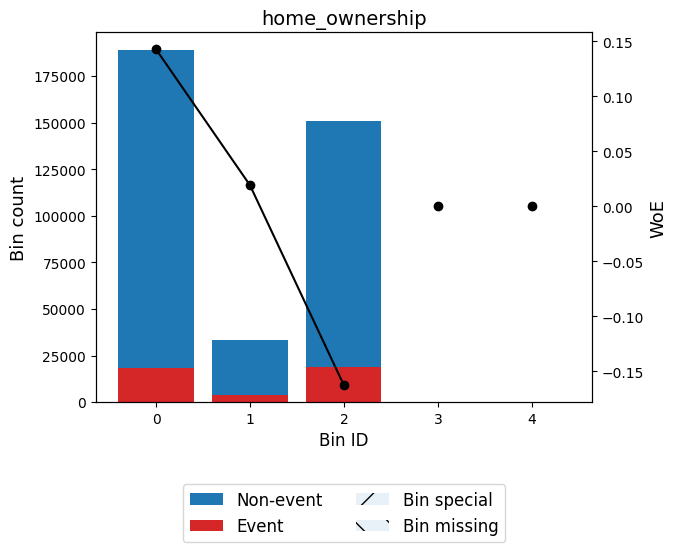

In [ ]:
creates_analis_woe(binning_process,columns[3])

Variable 'home_ownership':  Es el estado de propiedad al momento del préstamo (ALQUILER, PROPIO, HIPOTECA, OTROS), una característica básica del prestatario. El método generó 5 bins y la suma de los IV parciales tienen un valor total de 0.021223, lo cual implica un poder predictivo débil. 

annual_inc
                           Bin   Count  Count (%)  Non-event  Event  Event rate       WoE            IV            JS
0             (-inf, 28156.23)   19703   0.052819      16709   2994    0.151957 -0.378408  8.753139e-03  1.087661e-03
1         [28156.23, 37038.50)   33128   0.088808      28483   4645    0.140214 -0.284229  8.010096e-03  9.979052e-04
2         [37038.50, 44826.44)   34810   0.093317      30211   4599    0.132117 -0.215378  4.706625e-03  5.871937e-04
3         [44826.44, 50017.00)   38631   0.103561      33864   4767    0.123398  -0.13711  2.053631e-03  2.565030e-04
4         [50017.00, 60845.50)   53825   0.144292      47556   6269    0.116470 -0.071454  7.575306e-04  9.467119e-05
5         [60845.50, 66097.50)   24275   0.065076      21614   2661    0.109619 -0.003106  6.284465e-07  7.855578e-08
6         [66097.50, 73844.00)   27438   0.073555      24610   2828    0.103069  0.065838  3.107303e-04  3.883427e-05
7         [73844.00, 80047.00)   28472   0.07

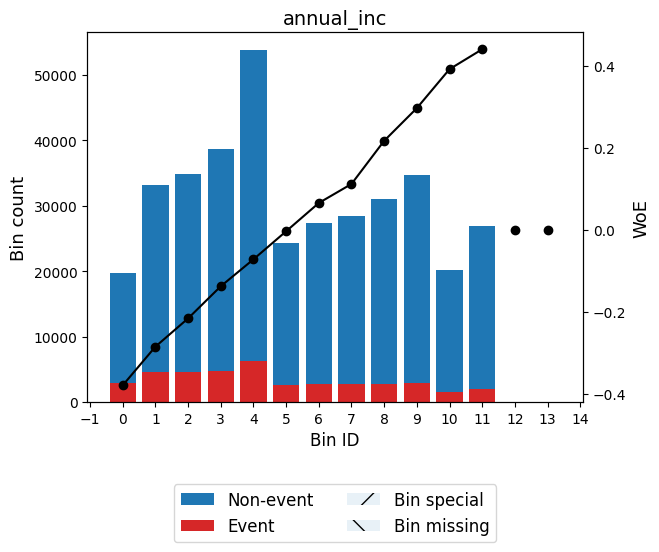

In [ ]:
creates_analis_woe(binning_process,columns[4])

Variable 'annual_inc': Es el ingreso anual del prestatario al momento del préstamo, una característica básica del prestatario. El método generó 14 bins y la suma de los IV parciales tienen un valor total de 0.0528327, lo cual implica un poder predictivo débil. 

verification_status
                      Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0          [Not Verified]  118584   0.317896     107399  11185    0.094321  0.164232  0.008040  0.001004
1       [Source Verified]  120030   0.321772     107537  12493    0.104082  0.054922  0.000950  0.000119
2              [Verified]  134414   0.360332     117314  17100    0.127219 -0.171969  0.011394  0.001422
3                 Special       0   0.000000          0      0    0.000000       0.0  0.000000  0.000000
4                 Missing       0   0.000000          0      0    0.000000       0.0  0.000000  0.000000
Totals                     373028   1.000000     332250  40778    0.109316            0.020384  0.002545


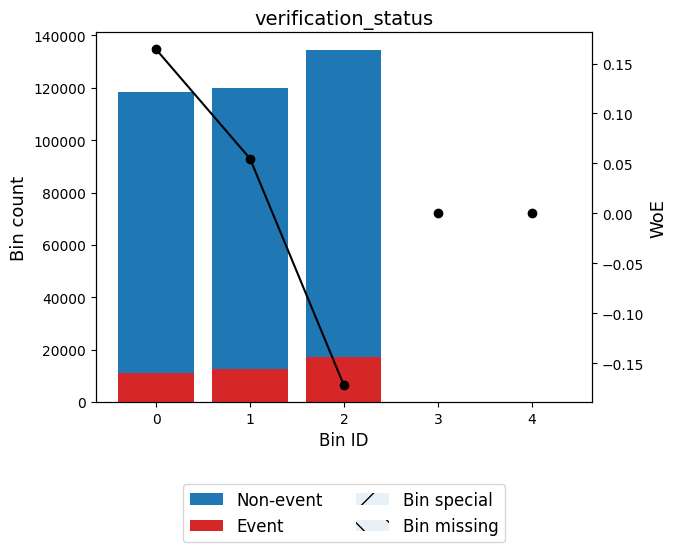

In [ ]:
creates_analis_woe(binning_process,columns[5])

Variable 'verification_status': La verificación del estatus, es una característica básica del prestatario. El método genero 5 bins y  la suma de los IV parciales tienen un valor total de 0.020384, lo cual implica un poder predictivo débil. 

purpose
                                                                                   Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0                                                                   [credit_card, car]   87906   0.235655      80252   7654    0.087070  0.252198  0.013579  0.001693
1                                                   [major_purchase, home_improvement]   29075   0.077943      26225   2850    0.098022  0.121649  0.001100  0.000137
2                                              [debt_consolidation, vacation, wedding]  223061   0.597974     197811  25250    0.113198 -0.039259  0.000936  0.000117
3       [medical, renewable_energy, other, house, moving, educational, small_business]   32986   0.088428      27962   5024    0.152307 -0.381125  0.014881  0.001849
4                                                                              Special       0   0.000000          0      0    0.000000       0.0  0.000000  0.000

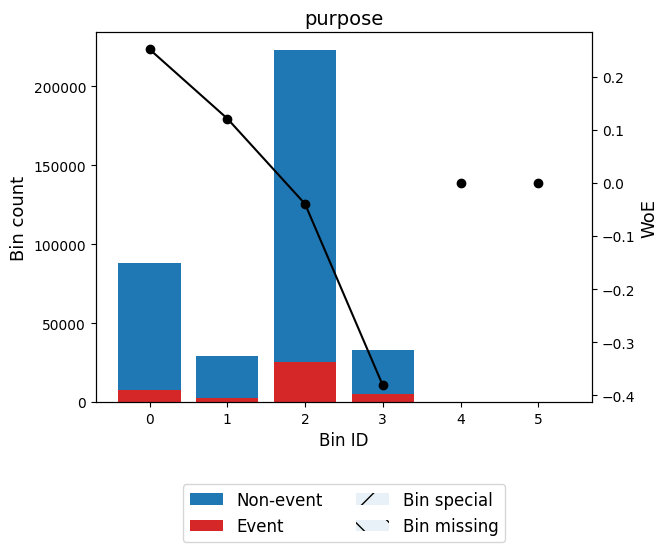

In [ ]:
creates_analis_woe(binning_process,columns[6])

Variable 'purpose': Es el propósito del préstamo, una característica básica del prestatario. El método generó 6 bins y  la suma de los IV parciales tienen un valor total de 0.030495, lo cual implica un poder predictivo débil. 

dti
                   Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0         (-inf, 8.99)   59684   0.159999      54452   5232    0.087662  0.244781  0.008710  0.001086
1        [8.99, 10.65)   22725   0.060920      20624   2101    0.092453  0.186297  0.001966  0.000245
2       [10.65, 12.44)   27874   0.074724      25211   2663    0.095537  0.150082  0.001587  0.000198
3       [12.44, 15.59)   53851   0.144362      48497   5354    0.099422  0.105913  0.001554  0.000194
4       [15.59, 16.79)   20797   0.055752      18585   2212    0.106361  0.030713  0.000052  0.000006
5       [16.79, 18.20)   24252   0.065014      21550   2702    0.111413 -0.021361  0.000030  0.000004
6       [18.20, 20.49)   37382   0.100212      33006   4376    0.117062 -0.077191  0.000615  0.000077
7       [20.49, 21.87)   20467   0.054867      17984   2483    0.121317  -0.11773  0.000796  0.000099
8       [21.87, 26.44)   55290   0.148219      48343   6947    0.125647 -0.157

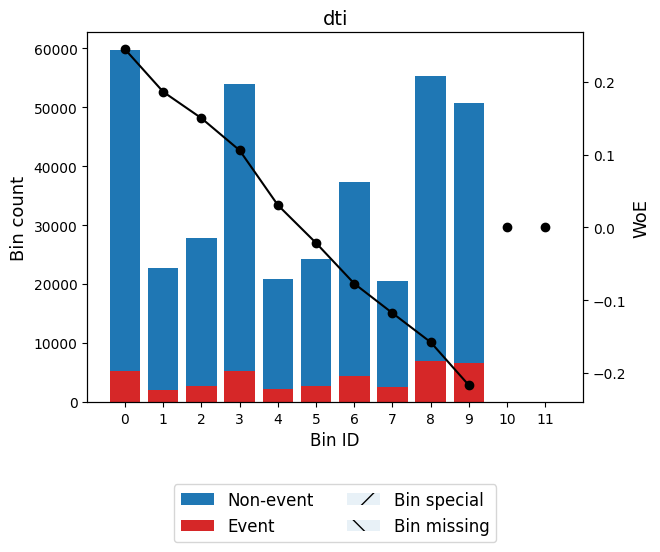

In [ ]:
creates_analis_woe(binning_process,columns[7])

Variable 'dti': Es una característica básica del prestatario que relaciona los pagos de deuda mensuales totales del prestatario y las obligaciones de deuda totales, (excluyendo la hipoteca y el préstamo de LC solicitado), penalizados por los ingresos mensuales autodeclarados del prestatario. El método generó 12 bins y la suma de los IV parciales tienen un valor total de 0.026189, lo cual implica un poder predictivo débil. 

inq_last_6mths
                 Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV            JS
0       (-inf, 0.50)  193208   0.517945     175510  17698    0.091601  0.196499  0.018518  2.311004e-03
1       [0.50, 1.50)  104163   0.279236      92179  11984    0.115050 -0.057585  0.000947  1.183590e-04
2       [1.50, 2.50)   46214   0.123889      39938   6276    0.135803  -0.24715  0.008329  1.038533e-03
3        [2.50, inf)   29419   0.078865      24602   4817    0.163738 -0.467069  0.020589  2.550452e-03
4            Special       0   0.000000          0      0    0.000000       0.0  0.000000  0.000000e+00
5            Missing      24   0.000064         21      3    0.125000 -0.151835  0.000002  1.965069e-07
Totals                373028   1.000000     332250  40778    0.109316            0.048384  6.018544e-03


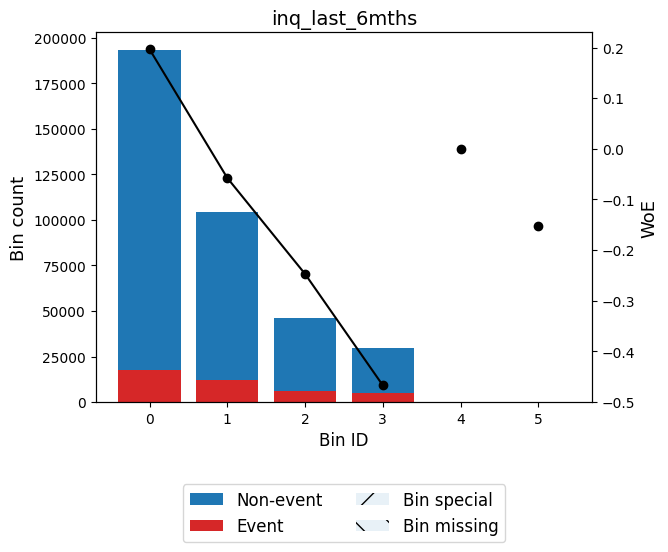

In [ ]:
creates_analis_woe(binning_process,columns[8])

Variable 'inq_last_6mths':  Son el número de consultas en los últimos 6 meses (excluyendo consultas sobre automóviles e hipotecas), característica del registro personal del prestatario. El método genero 6 bins y  la suma de los IV parciales tienen un valor total de 0.048384, lo cual implica un poder predictivo débil. 

revol_util
                   Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0        (-inf, 24.45)   40595   0.108826      37250   3345    0.082399   0.31244  0.009400  0.001170
1       [24.45, 32.25)   24653   0.066089      22394   2259    0.091632  0.196126  0.002354  0.000294
2       [32.25, 38.78)   25943   0.069547      23532   2411    0.092935  0.180575  0.002113  0.000264
3       [38.78, 47.05)   38610   0.103504      34712   3898    0.100958  0.088877  0.000790  0.000099
4       [47.05, 50.65)   18837   0.050498      16878   1959    0.103997  0.055832  0.000154  0.000019
5       [50.65, 54.15)   18897   0.050658      16893   2004    0.106049  0.034009  0.000058  0.000007
6       [54.15, 57.65)   19341   0.051849      17265   2076    0.107337  0.020493  0.000022  0.000003
7       [57.65, 61.45)   21175   0.056765      18794   2381    0.112444 -0.031728  0.000058  0.000007
8       [61.45, 66.35)   27075   0.072582      24006   3069    0.113352

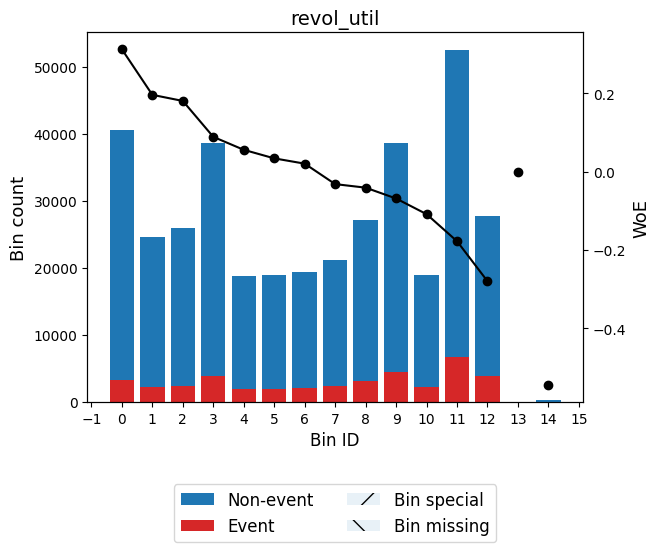

In [ ]:
creates_analis_woe(binning_process,columns[9])

Variable 'revol_util':  Es latasa de utilización de la línea rotatoria o la cantidad de crédito que el prestatario está utilizando en relación con todo el crédito rotatorio disponible, característica del registro personal del prestatario. El método generó 15 bins y la suma de los IV parciales tienen un valor total de 0.027666, lo cual implica un poder predictivo débil. 

initial_list_status
            Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0           [w]  130514   0.349877     118912  11602    0.088895  0.229461  0.016839  0.002100
1           [f]  242514   0.650123     213338  29176    0.120306 -0.108214  0.007941  0.000992
2       Special       0   0.000000          0      0    0.000000       0.0  0.000000  0.000000
3       Missing       0   0.000000          0      0    0.000000       0.0  0.000000  0.000000
Totals           373028   1.000000     332250  40778    0.109316            0.024780  0.003092


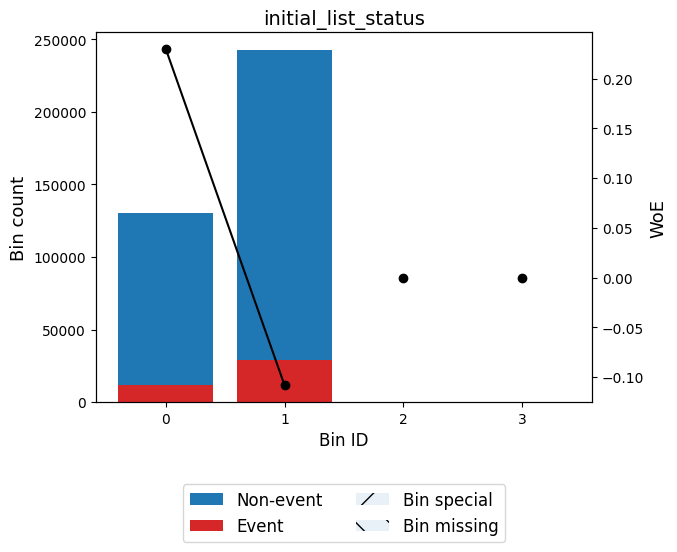

In [ ]:
creates_analis_woe(binning_process,columns[10])

Variable 'initial_list_status':  Es el estado inicial de la lista del préstamo, característica del registro personal del prestatario. El método generó 4 bins y la suma de los IV parciales tienen un valor total de 0.024780, lo cual implica un poder predictivo débil. 

total_rec_int
                       Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0           (-inf, 340.60)   20617   0.055269      17150   3467    0.168162 -0.499036  0.016670  0.002062
1         [340.60, 621.98)   30304   0.081238      26264   4040    0.133316  -0.22579  0.004521  0.000564
2         [621.98, 771.49)   18781   0.050347      16647   2134    0.113625 -0.043513  0.000097  0.000012
3         [771.49, 931.92)   20269   0.054336      18010   2259    0.111451  -0.02174  0.000026  0.000003
4        [931.92, 1482.22)   63841   0.171143      56955   6886    0.107862  0.015026  0.000038  0.000005
5       [1482.22, 2113.12)   57317   0.153653      51482   5835    0.101802  0.079613  0.000944  0.000118
6       [2113.12, 2754.54)   42601   0.114203      38295   4306    0.101077  0.087565  0.000846  0.000106
7       [2754.54, 6906.14)   95059   0.254831      85508   9551    0.100474  0.094219  0.002180  0.000272
8           [6906.14, inf)   242

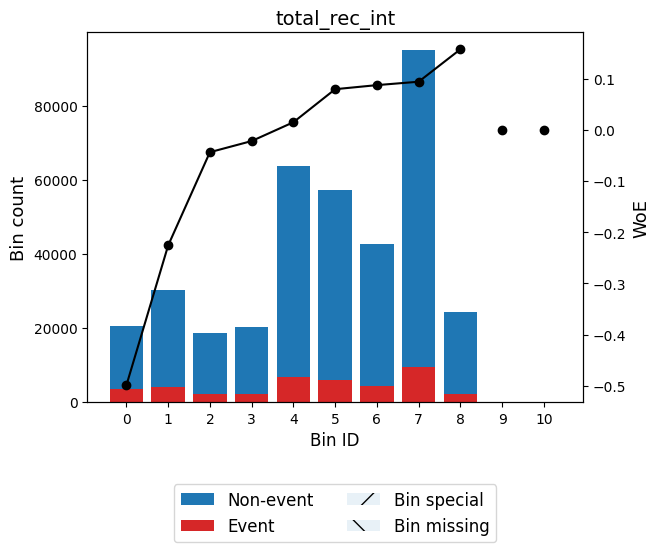

In [ ]:
creates_analis_woe(binning_process,columns[11])

Variable 'total_rec_int':  Es el Intereses recibido hasta la fecha, característica del estado actual del préstamo después de su emisión. El método generó 11 bins y la suma de los IV parciales tienen un valor total de 0.026840, lo cual implica un poder predictivo débil. 

tot_cur_bal
                           Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0             (-inf, 10259.50)   20319   0.054470      18224   2095    0.103105  0.065441  0.000227  0.000028
1         [10259.50, 18043.50)   24921   0.066807      22047   2874    0.115324 -0.060273  0.000248  0.000031
2         [18043.50, 26370.50)   26940   0.072220      23692   3248    0.120564 -0.110647  0.000923  0.000115
3         [26370.50, 54241.00)   60356   0.161800      53449   6907    0.114438 -0.051552  0.000439  0.000055
4         [54241.00, 74562.50)   20519   0.055007      18184   2335    0.113797 -0.045215  0.000114  0.000014
5        [74562.50, 134066.50)   37639   0.100901      33686   3953    0.105024  0.044863  0.000200  0.000025
6       [134066.50, 163622.50)   18914   0.050704      16994   1920    0.101512   0.08279  0.000336  0.000042
7       [163622.50, 203641.50)   24976   0.066955      22570   2406    0.096332  0.140911  0.001258  0.00015

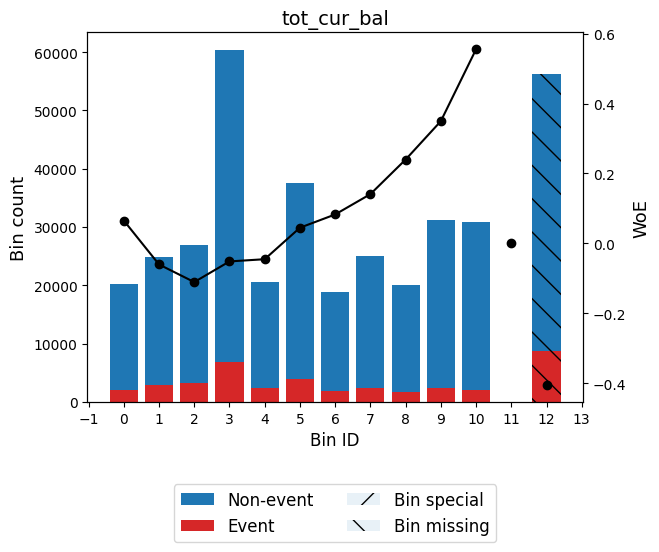

In [ ]:
creates_analis_woe(binning_process,columns[12])

Variable 'tot_cur_bal':  Es el saldo total actual de todas las cuentas. El método generó 13 bins de los cuales el contenedor missing presenta gran proporción (15%) de observaciones y la suma de los IV parciales tienen un valor total de 0.065099, lo cual implica un poder predictivo débil. 

total_rev_hi_lim
                         Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0            (-inf, 6768.50)   20787   0.055725      18257   2530    0.121711 -0.121416  0.000861  0.000108
1        [6768.50, 16405.00)   85370   0.228857      75661   9709    0.113728 -0.044535  0.000462  0.000058
2       [16405.00, 19244.00)   24281   0.065092      21584   2697    0.111075 -0.017933  0.000021  0.000003
3       [19244.00, 27926.00)   61242   0.164175      54768   6474    0.105712  0.037567  0.000228  0.000029
4       [27926.00, 31796.00)   20088   0.053851      18057   2031    0.101105   0.08726  0.000396  0.000050
5       [31796.00, 36003.00)   18837   0.050498      16958   1879    0.099750  0.102255  0.000507  0.000063
6       [36003.00, 46195.00)   32053   0.085927      29249   2804    0.087480  0.247053  0.004761  0.000594
7       [46195.00, 55836.50)   18678   0.050071      17101   1577    0.084431  0.285868  0.003658  0.000456
8          

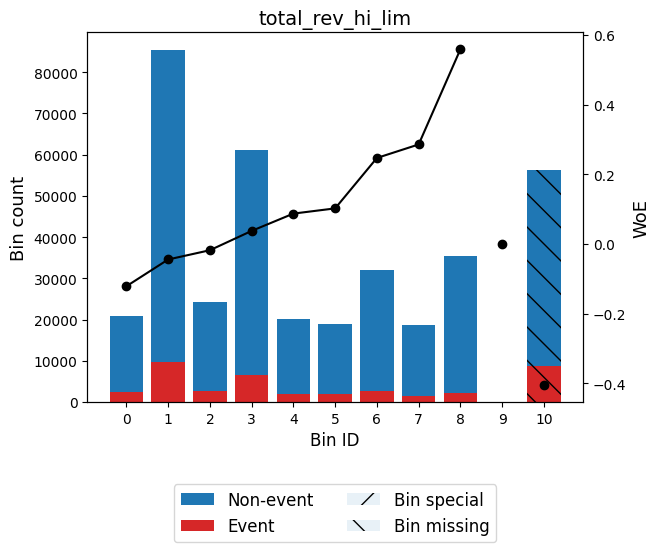

In [ ]:
creates_analis_woe(binning_process,columns[13])

Variable 'total_rev_hi_lim':  Es el total de crédito rotativo alto/límite de crédito. El método generó 11 bins de los cuales el contenedor missing presenta gran proporción (15%) de observaciones y la suma de los IV parciales tienen un valor total de 0.063817, lo cual implica un poder predictivo débil. 

mths_since_issue_d
                   Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0        (-inf, 69.50)   28170   0.075517      26543   1627    0.057756  0.694283  0.027764  0.003402
1       [69.50, 70.50)   31082   0.083324      28912   2170    0.069815  0.491785  0.016624  0.002057
2       [70.50, 72.50)   23650   0.063400      21764   1886    0.079746  0.348054  0.006702  0.000833
3       [72.50, 73.50)   23518   0.063046      21543   1975    0.083978  0.291738  0.004786  0.000596
4       [73.50, 75.50)   29038   0.077844      26384   2654    0.091397  0.198945  0.002850  0.000356
5       [75.50, 77.50)   28367   0.076045      25581   2786    0.098213  0.119498  0.001036  0.000129
6       [77.50, 79.50)   24647   0.066073      22169   2478    0.100540  0.093498  0.000557  0.000070
7       [79.50, 81.50)   23723   0.063596      21219   2504    0.105552  0.039263  0.000097  0.000012
8       [81.50, 83.50)   21590   0.057878      19077   2513    

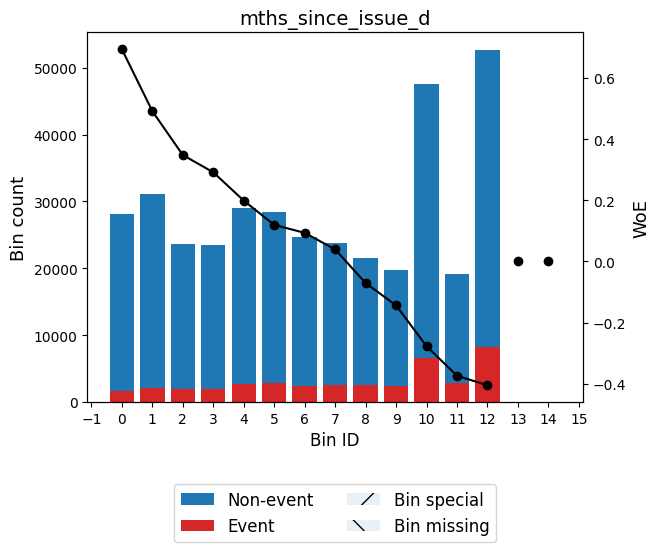

In [ ]:
creates_analis_woe(binning_process,columns[14])

Variable 'mths_since_issue_d':  El método generó 15 bins y la suma de los IV parciales tienen un valor total de 0.108265, lo cual implica un poder predictivo medio. 

mths_since_last_credit_pull_d
                   Bin   Count  Count (%)  Non-event  Event  Event rate       WoE        IV        JS
0        (-inf, 55.50)  262082   0.702580     241277  20805    0.079384  0.353007  0.076246  0.009482
1       [55.50, 59.50)   30814   0.082605      27350   3464    0.112416 -0.031452  0.000083  0.000010
2       [59.50, 64.50)   24907   0.066770      20963   3944    0.158349 -0.427181  0.014364  0.001782
3       [64.50, 73.50)   27419   0.073504      21398   6021    0.219592 -0.829701  0.069072  0.008395
4         [73.50, inf)   27771   0.074447      21233   6538    0.235425  -0.91982  0.088693  0.010712
5              Special       0   0.000000          0      0    0.000000       0.0  0.000000  0.000000
6              Missing      35   0.000094         29      6    0.171429 -0.522209  0.000031  0.000004
Totals                  373028   1.000000     332250  40778    0.109316            0.248490  0.030384


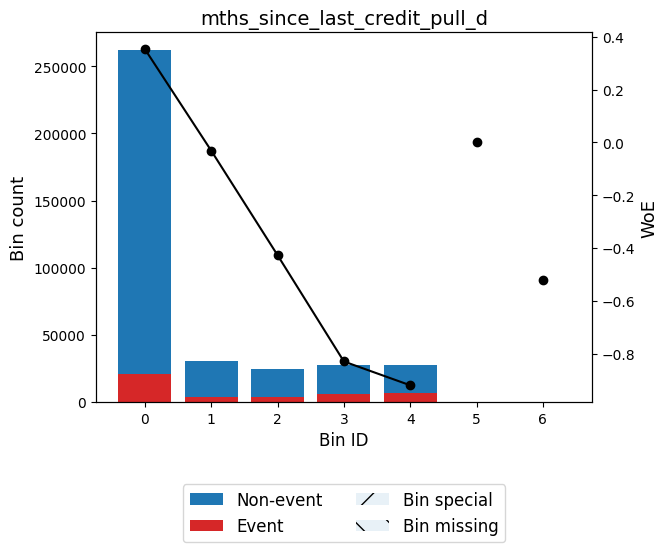

In [ ]:
creates_analis_woe(binning_process,columns[15])

Variable 'mths_since_last_credit_pull_d':  El método generó 7 bins y la suma de los IV parciales tienen un valor total de 0.248490, lo cual implica un poder predictivo medio.

## Modelos de clasificación

El modelo de regresión logística es una de las técnicas estadísticas más utilizadas para resolver el problema de clasificación binaria, en nuestro caso: Bueno y Malo. Utilizaremos el IV y WOE como punto de referencia para detectar variables en los proyectos de modelos de riesgo de crédito como para calcular la probabilidad de mora.

Ajustaremos un modelo de regresión logística para que penalice los falsos negativos más que los falsos positivos, usaremos matrices de confusión y curvas AUC-ROC para evaluar el rendimiento del modelo de clasificación que predecirá la probabilidad de incumplimiento de obligaciones financieras.


### Regresión logística

Un modelo 100% preciso es donde existen 0 falsos positivos y 0 falsos negativos, un ideal difícil de cumplir, entonces el objetivo será encontrar el modelo más óptimo posible que detecte con mayor precisión los falsos negativos, es decir a los usuarios con más probabilidad de incumplimiento financiero.

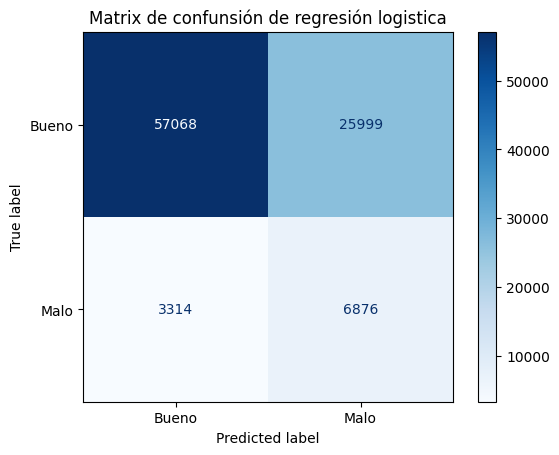

              precision    recall  f1-score   support

       Bueno       0.95      0.69      0.80     83067
        Malo       0.21      0.67      0.32     10190

    accuracy                           0.69     93257
   macro avg       0.58      0.68      0.56     93257
weighted avg       0.86      0.69      0.74     93257

La especificada del modelo es de: 0.687011689359192, y el recall de 0.6747791952894995


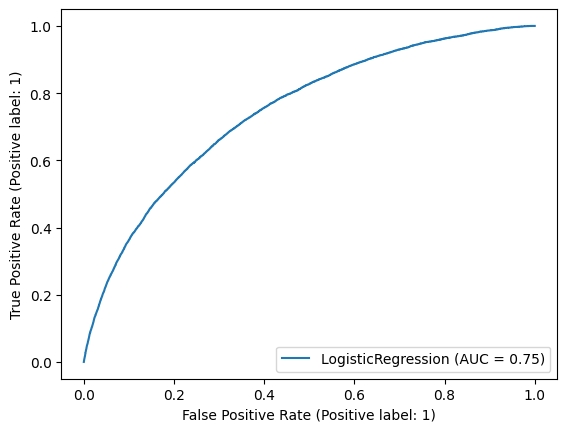

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, plot_roc_curve, classification_report, RocCurveDisplay
from sklearn.linear_model import LogisticRegression
import joblib


def plots_confution_matrix(model, x_train, y_train, x_test, y_val, title, curve=True):
    model.fit(x_train, y_train)
    disp = ConfusionMatrixDisplay.from_estimator(
            model,
            x_test,
            y_val,
            display_labels=["Bueno", "Malo"],
            cmap=plt.cm.Blues,
        )
    
    disp.ax_.set_title(f"Matrix de confunsión de {title}")
    plt.show()
    y_log = model.predict(x_test)
    tn, fp, fn, tp = confusion_matrix(y_val, y_log).ravel()
    specificity = tn / (tn+fp)
    recall = tp/(tp+fn)
    print(classification_report(y_val, y_log, target_names=["Bueno", "Malo"]))
    print(f"La especificada del modelo es de: {specificity}, y el recall de {recall}")
    if curve:
        
        RocCurveDisplay.from_estimator(model, x_test, y_val)
        plt.show()
    title_save = title.replace(" ", "_") 
    #joblib.dump(model, f"{title_save}_model.pkl")


reg = LogisticRegression(max_iter=1000, class_weight = 'balanced')
plots_confution_matrix(reg,x_transform_train, y_train, x_transform_val, y_val, "regresión logistica")

In [ ]:
joblib.dump(pipe, "pipeline_model.pkl")

['pipeline_model.pkl']

La regresión logística tiene unos buenos resultados, aunque la precisión es del 21%, esto quiere decir que nuestro modelo tiene problemas para detectar los falsos positivos, en la lógica de nuestro objetivo, no tiene tanta relevancia, dado que se quieren detectar a los malos usuarios. Consideramos como bueno el valor de exhaustividad (Recall) sea del 67%, en otras palabras  la proporción de usuarios que se identificaron correctamente por imcumplimiento financiero fue del 67%, es decir verdaderos positivos, sobre el número total de personas que realmente imcumplieron sus obligaciones.

El AUC del 75% implica que el modelo distingue correctamente entre clase Bueno y clase Mala el 75% de las veces, en consecuencia se puede decir que este modelo, para ser uno inicial, es bueno, aunque hay que buscar uno que mejore la presión y por ende el f1-score.

### Regresión Lineal de Rigde

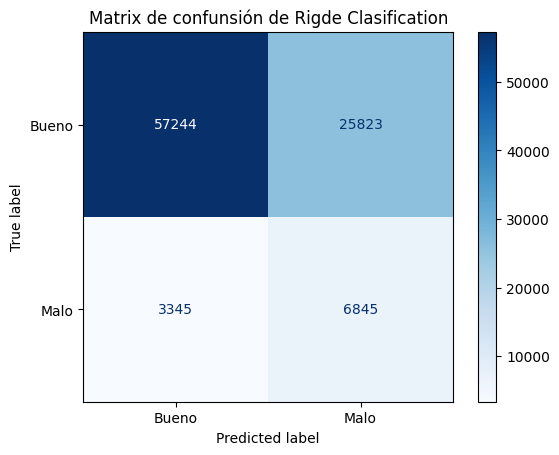

              precision    recall  f1-score   support

       Bueno       0.94      0.69      0.80     83067
        Malo       0.21      0.67      0.32     10190

    accuracy                           0.69     93257
   macro avg       0.58      0.68      0.56     93257
weighted avg       0.86      0.69      0.74     93257

La especificada del modelo es de: 0.6891304609532064, y el recall de 0.6717369970559371


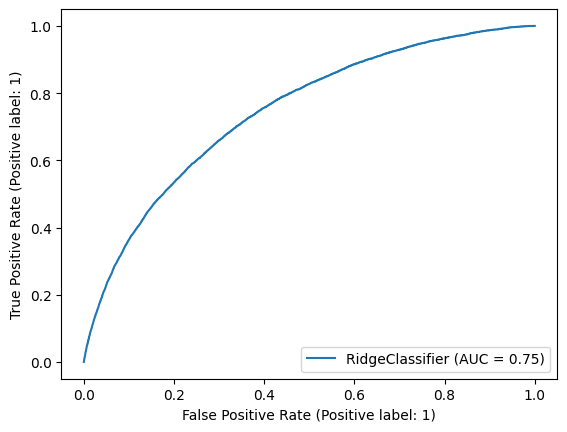

In [ ]:
from sklearn.linear_model import RidgeClassifier
rigde = RidgeClassifier(max_iter=1500, class_weight = 'balanced')
plots_confution_matrix(rigde,x_transform_train, y_train, x_transform_val, y_val, "Rigde Clasification")

Tiene las mismas métricas que la regresión logistica. Por lo tanto, sería interesante explorar otra familia de modelos.

### xgboost con transformación

Lo primero es que se calcula una penalización, dado que el modelo está desbalanceado.

In [ ]:
from collections import Counter
counter = Counter(y_train)
estimate = counter[0] / counter[1]
print(f"Valor de la estimación {estimate}")

Valor de la estimación 8.147775761439991


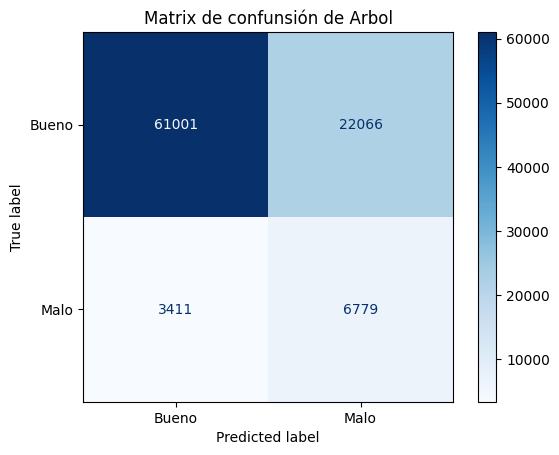

              precision    recall  f1-score   support

       Bueno       0.95      0.73      0.83     83067
        Malo       0.24      0.67      0.35     10190

    accuracy                           0.73     93257
   macro avg       0.59      0.70      0.59     93257
weighted avg       0.87      0.73      0.77     93257

La especificada del modelo es de: 0.7343590114004358, y el recall de 0.6652600588812562


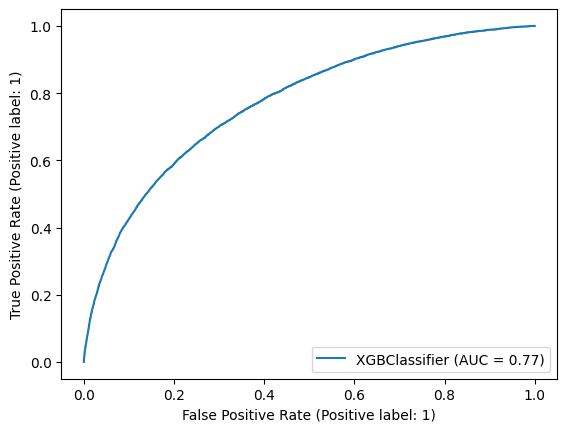

In [ ]:
import xgboost as xgb
xgb_model_1 = xgb.XGBClassifier(n_jobs=-1,scale_pos_weight=estimate)
plots_confution_matrix(xgb_model_1,x_transform_train, y_train, x_transform_val, y_val, "Arbol")

Con el Xboost, tenemos igual proporción que en los modelos anteriores de verdaderos positivos y verdaderos negativos, el 95% y el 67% respectivamente.  Este modelo tiene problemas para detectar los falsos positivos ( precisión es del 24%) pero las proporciones para detectar a los malos usuarios son mejores. Obtuvimos mejor precisión de AUC, lo cual implica que el modelo distingue correctamente entre clase Bueno y clase Mala el 77% de las veces, en consecuencia se puede decir que este modelo es mejor que los modelos con regresión logística y regresión lineal de Rigde, aunque la diferencia es mínima.

### Xgboost sin transformación de los datos

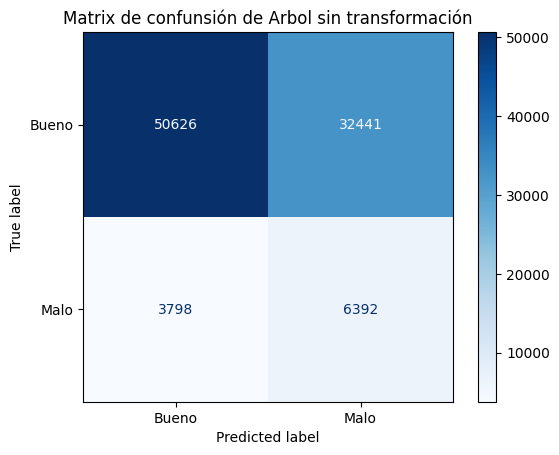

              precision    recall  f1-score   support

       Bueno       0.93      0.61      0.74     83067
        Malo       0.16      0.63      0.26     10190

    accuracy                           0.61     93257
   macro avg       0.55      0.62      0.50     93257
weighted avg       0.85      0.61      0.68     93257

La especificada del modelo es de: 0.6094598336282759, y el recall de 0.6272816486751718


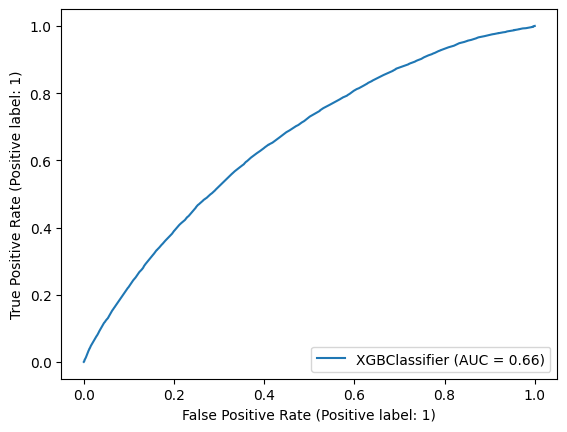

In [ ]:
#Usemos Xgboost para predecir los valores sin necesidad de trasnformar por medio del WoE
#Primero convertimos a variables catregoricas

full_pipeline = compose.ColumnTransformer([('cat', preprocessing.OneHotEncoder(handle_unknown='ignore'), categorical_data)])
encoder = full_pipeline.fit(x_train)
X_train_xg = encoder.transform(x_train)
X_test_xg = encoder.transform(x_val)

# Model
xgb_model_2 = xgb.XGBClassifier(n_jobs=-1,scale_pos_weight=estimate)
plots_confution_matrix(xgb_model_2,X_train_xg, y_train, X_test_xg, y_val, "Arbol sin transformación" )

En comparación con el modelo xgboost con transformación, este las mejores métricas, entonces es preferible aplicar el método con los datos transformados. 

## Anexos

1. Link página web: https://tholes-riesgo-de-credito-app-u20947.streamlitapp.com/

undefined. Video promocional: https://youtu.be/Hx_-BRPqA3U 

## Conclusiones

Entonces, nuestro mejor modelo tiene como objetivo predecir la probabilidad de que un individuo incumpla sus obligaciones financieras en los siguientes 12 meses a la fecha de originación de su crédito, basado en el valor de 16 variables para el nuevo caso y en lo “aprendido” por el modelo a partir de los datos de entrenamiento.

De la matriz de confusión y las métricas exactitud y precisión se puede decir:

Podemos considerar que los valores estimados de forma correcta (los verdaderos positivos y verdaderos negativos) por el modelo son buenos, el 95% y el 67% respectivamente, es decir que la proporción de usuarios que se identificaron correctamente por imcumplimiento financiero fue del 67% y el número total de personas que realmente imcumplieron sus obligaciones financieras y el 5% de las veces se identificó incorrectamente a usuarios que no cumplieron con su obligación.

Para los casos en los que el modelo se equivoca, tenemos un recall del 24%, lo cual implica que nuestro modelo tiene problemas para detectar los falsos positivos, es decir, el 24% de las veces el modelo clasifica a usuarios que cumplen con sus obligaciones financieras como personas que las van a incumplir, lo cual no impacta directamente el objetivo de predicción. Por otro lado obtuvimos un AUC del 77%, implicando que el modelo distingue correctamente entre clase Bueno y clase Mala el 77% de las veces.

## Referencias

- Librería de optimal binnnig. Recuperado de interrnet el 12 de octubre de 2022. https://gnpalencia.org/optbinning/

- Xgboost. Recuperado de interrnet el 12 de octubre de 2022. https://xgboost.readthedocs.io/en/stable/

- Sklearn. Recuperado de interrnet el 14 de octubre de 2022. https://scikit-learn.org/stable/index.html

- Ensable model. Recuperado de interrnet el 11 de octubre de 2022. https://scikit-learn.org/stable/modules/ensemble.html?highlight=voting+model

- Missingno. Recuperado de interrnet el 13 de octubre de 2022. https://github.com/ResidentMario/missingno

- Métricas de clasificación. Recuperado de interrnet el 13 de octubre de 2022. https://www.iartificial.net/precision-recall-f1-accuracy-en-clasificacion/ 

- Medidas de predicción. Recuperado de interrnet el 11 de octubre de 2022. http://eio.usc.es/pub/mte/descargas/ProyectosFinMaster/Proyecto_1589.pdf

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=321af7d5-4862-4e80-98c6-0b7c4eef2b47' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>